## Data Collection en Munging
#### Verkrijgen (Collection)
Voor het verkijgen van de dataset hebben wij van voetbalvereniging NEC data tot onze beschikking gekregen. Deze data is opgeslagen in txt of xml-bestanden. Door middel van UNIX commando's zullen de de data eerst gaan verkennen zodat we weten wat we in handen hebben. Allereerst bekijken we de 2 txt-bestanden:

In [2]:
#toon de 1e 5 regels
!head -n 5 'gps/20160410 FC Utrecht - NEC/0f36e36d4ce04e18b3b1a1d68d830139.txt'

'head' is not recognized as an internal or external command,
operable program or batch file.


In [3]:
!head -n 5 'gps/20160420 PEC - NEC/87840ed253414bec9ede11f5532cea5f.txt'

'head' is not recognized as an internal or external command,
operable program or batch file.


We zien dat de 2 txt-bestanden alleen verschillen qua data. Ze beginnen beide met 3 regels onbruikbare tekst. Deze zullen we dan ook moeten uitsluiten als we wat met de data gaan doen.

We zullen nu de xml-bestanden bekijken:

In [4]:
!head -n 8 'new-xml/20160410 FC Utrecht - NEC-new.xml'

'head' is not recognized as an internal or external command,
operable program or batch file.


In [5]:
!head -n 8 'new-xml/20160420 PEC - NEC-new.xml'

'head' is not recognized as an internal or external command,
operable program or batch file.


We zien dat de 2 xml-bestanden ook alleen verschillen qua data. Ze beginnen beide met informatie over wanneer de wedstrijd ongeveer begon. Daarna volgen de verichtingen op het veld. De informatie van de wedstrijd moeten we uitsluiten als we wat met de data gaan doen.

We zullen nu het verschil tussen de txt-bestanden bekijken:

In [6]:
!wc 'gps/20160410 FC Utrecht - NEC/0f36e36d4ce04e18b3b1a1d68d830139.txt' 'gps/20160420 PEC - NEC/87840ed253414bec9ede11f5532cea5f.txt'

'wc' is not recognized as an internal or external command,
operable program or batch file.


De eerste kolom van dit verschil betreft het aantal records van het txt-bestand. Bij de wedstrijd FC Utrecht - NEC had een speler 98446 records; bij de wedstrijd PEC - NEC heeft een spelers 113144 records. Dit zou kunnen liggen aan: het verschil in tijd dat de wedstrijd duurde, of doordat de speler korter heeft gespeeld, of doordat de meting eerder was begonnen of gestopt door de data analysten van NEC.

De tweede kolom betreft het aantal woorden in het bestand. Deze is bij beide ongeveer gelijk aan het aantal records.

De derde kolom betreft het aantal karakters in het bestand. Deze is bij de wedstrijd PEC - NEC groter dan bij FC Utrecht - NEC, maar dit komt logischer wijze doordat het txt-bestand van de wedstrijd PEC - NEC 15000 meer records heeft dan het txt-bestand van de wedstrijd FC Utrecht - NEC.

We zullen nu het verschil tussen de xml-bestanden bekijken:

In [7]:
!wc 'new-xml/20160410 FC Utrecht - NEC-new.xml' 'new-xml/20160420 PEC - NEC-new.xml'

'wc' is not recognized as an internal or external command,
operable program or batch file.


De eerste kolom van dit verschil betreft het aantal records van het xml-bestand. Bij de wedstrijd FC Utrecht - NEC had de wedstrijd 52590 records; bij de wedstrijd PEC - NEC heeft de wedstrijd 58166 records. Dit zou kunnen liggen aan: het verschil in tijd dat de wedstrijd duurde of doordat er minder gebeurde in de wedstrijd.

De tweede en derde kolommen zijn bij beide bestanden logisch aan elkaar.

Aan de hand van de bestanden is duidelijk af te lezen dat we voor onze vraag alleen de txt-bestanden zullen gebruiken, omdat deze iets zeggen over de spelers. De xml-bestanden zeggen namelijk iets over het verloop van de wedstrij.

### Bewerken (munging)

In [8]:
import numpy as np
import pandas as pd

Voor het gebruiken van de data moeten we de txt-bestanden omzetten naar pandas DataFrame. Dit doen we door de bestanden te importeren met numpy's genfromtxt methode en deze om te zetten naar een DataFrame. Hiervoor laden we elk txt-bestand in als DataFrame voor een aparte speler. We zullen de waarden '-' opvangen als 0.0, omdat het type van de kolom wordt gezien als een float.

In [9]:
convertfunc = lambda x: 0.0 if b'-' in x else x
df1 = pd.DataFrame(np.genfromtxt('gps/20160410 FC Utrecht - NEC/0f36e36d4ce04e18b3b1a1d68d830139.txt',delimiter=',', 
                            skip_header=3,converters = {0: convertfunc}), 
                   columns=['GPStijd','dt(ms)','lat','long','snelheid','acc_x','acc_y','acc_z', 
                            'gyro_x','gyro_y','gyro_z','hartslag'])
df1['speler'] = 's1'

df2 = pd.DataFrame(np.genfromtxt('gps/20160410 FC Utrecht - NEC/00fa2184833d4b61a53820b0390fb3c6.txt',delimiter=',', 
                            skip_header=3,converters = {0: convertfunc}), 
                   columns=['GPStijd','dt(ms)','lat','long','snelheid','acc_x','acc_y','acc_z', 
                            'gyro_x','gyro_y','gyro_z','hartslag'])
df2['speler'] = 's2'

df3 = pd.DataFrame(np.genfromtxt('gps/20160410 FC Utrecht - NEC/3d13ae1a180a4feda47d883fb3352b4a.txt',delimiter=',', 
                            skip_header=3,converters = {0: convertfunc}), 
                   columns=['GPStijd','dt(ms)','lat','long','snelheid','acc_x','acc_y','acc_z', 
                            'gyro_x','gyro_y','gyro_z','hartslag'])
df3['speler'] = 's3'

df4 = pd.DataFrame(np.genfromtxt('gps/20160410 FC Utrecht - NEC/4e83b84ffd124bf0a02c9e5b7fb32daa.txt',delimiter=',', 
                            skip_header=3,converters = {0: convertfunc}), 
                   columns=['GPStijd','dt(ms)','lat','long','snelheid','acc_x','acc_y','acc_z', 
                            'gyro_x','gyro_y','gyro_z','hartslag'])
df4['speler'] = 's4'

df5 = pd.DataFrame(np.genfromtxt('gps/20160410 FC Utrecht - NEC/9b1b2c723b584e2d9065ae562e83f8f2.txt',delimiter=',', 
                            skip_header=3,converters = {0: convertfunc}), 
                   columns=['GPStijd','dt(ms)','lat','long','snelheid','acc_x','acc_y','acc_z', 
                            'gyro_x','gyro_y','gyro_z','hartslag'])
df5['speler'] = 's5'

df6 = pd.DataFrame(np.genfromtxt('gps/20160410 FC Utrecht - NEC/9c22deb258fa4a55bb736b89a40004d5.txt',delimiter=',', 
                            skip_header=3,converters = {0: convertfunc}), 
                   columns=['GPStijd','dt(ms)','lat','long','snelheid','acc_x','acc_y','acc_z', 
                            'gyro_x','gyro_y','gyro_z','hartslag'])
df6['speler'] = 's6'

df7 = pd.DataFrame(np.genfromtxt('gps/20160410 FC Utrecht - NEC/31c9ca8e21a541cc8b1f804fcde1dde6.txt',delimiter=',', 
                            skip_header=3,converters = {0: convertfunc}), 
                   columns=['GPStijd','dt(ms)','lat','long','snelheid','acc_x','acc_y','acc_z', 
                            'gyro_x','gyro_y','gyro_z','hartslag'])
df7['speler'] = 's7'

df8 = pd.DataFrame(np.genfromtxt('gps/20160410 FC Utrecht - NEC/753a52e5fb8f4331a765c721b6b1271f.txt',delimiter=',', 
                            skip_header=3,converters = {0: convertfunc}), 
                   columns=['GPStijd','dt(ms)','lat','long','snelheid','acc_x','acc_y','acc_z', 
                            'gyro_x','gyro_y','gyro_z','hartslag'])
df8['speler'] = 's8'

df9 = pd.DataFrame(np.genfromtxt('gps/20160410 FC Utrecht - NEC/b6a6aeaf67e640fe9eb72d888ba046f9.txt',delimiter=',', 
                            skip_header=3,converters = {0: convertfunc}), 
                   columns=['GPStijd','dt(ms)','lat','long','snelheid','acc_x','acc_y','acc_z', 
                            'gyro_x','gyro_y','gyro_z','hartslag'])
df9['speler'] = 's9'

df10 = pd.DataFrame(np.genfromtxt('gps/20160410 FC Utrecht - NEC/f8a657255c064315b0d7842dbab2a360.txt',delimiter=',', 
                            skip_header=3,converters = {0: convertfunc}), 
                   columns=['GPStijd','dt(ms)','lat','long','snelheid','acc_x','acc_y','acc_z', 
                            'gyro_x','gyro_y','gyro_z','hartslag'])
df10['speler'] = 's10'

df11 = pd.DataFrame(np.genfromtxt('gps/20160410 FC Utrecht - NEC/f41f32eee9ae420eabc459c560e75678.txt',delimiter=',', 
                            skip_header=3,converters = {0: convertfunc}), 
                   columns=['GPStijd','dt(ms)','lat','long','snelheid','acc_x','acc_y','acc_z', 
                            'gyro_x','gyro_y','gyro_z','hartslag'])
df11['speler'] = 's11'

df12 = pd.DataFrame(np.genfromtxt('gps/20160410 FC Utrecht - NEC/feaf75270e9c46178b6b36507d9576da.txt',delimiter=',', 
                            skip_header=3,converters = {0: convertfunc}), 
                   columns=['GPStijd','dt(ms)','lat','long','snelheid','acc_x','acc_y','acc_z', 
                            'gyro_x','gyro_y','gyro_z','hartslag'])
df12['speler'] = 's12'

Voordat we iets met de dataset gaan doen, moeten we eerst weten hoe het dataframe eruit ziet.

In [10]:
df1.head()

,GPStijd,dt(ms),lat,long,snelheid,acc_x,acc_y,acc_z,gyro_x,gyro_y,gyro_z,hartslag,speler
0,0.0,8.0,NaN,NaN,NaN,0.000,0.000,0.000,0.000,0.000,0.000,0.0,s1
1,0.0,8.0,NaN,NaN,NaN,-0.357,-0.829,0.326,-2.183,43.664,49.145,0.0,s1
2,0.0,9.0,NaN,NaN,NaN,-0.558,-0.890,0.317,5.542,24.351,41.863,0.0,s1
3,0.0,8.0,NaN,NaN,NaN,-0.669,-0.890,0.323,7.344,3.588,-1.359,0.0,s1
4,0.0,9.0,NaN,NaN,NaN,-0.556,-0.829,0.241,8.229,-4.656,-15.557,0.0,s1


We zien hier veel kolommen met data. De kolommen betekenen het volgende:
- GPStijd: de tijd in seconden 
- dt(ms): onbekend
- lat: latitude
- long: longitude
- snelheid(m/s): snelheid in meter per seconde 
- acc_x(g-force): acceleratie zijwaarts
- acc_y: acceleratie voorwaarts
- acc_z: acceleratie opwaarts
- gyro_x(deg/s): rotatie waarbij de speler achterover leunt 
- gyro_y: rotatie waarbij de speler zijwaarts leunt
- gyro_z: rotatie waarbij de speler linksom draait
- heart rate (bpm): nog niet functioneel
- speler: de speler die hoort bij die rij

Ook is te zien dat er veel waarden onbekend zijn. Om de data beter te kunnen gebruiken, zullen de onbekende waarden verwijderen uit het dataframe.

In [11]:
df1 = df1.dropna()
df2 = df2.dropna()
df3 = df3.dropna()
df4 = df4.dropna()
df5 = df5.dropna()
df6 = df6.dropna()
df7 = df7.dropna()
df8 = df8.dropna()
df9 = df9.dropna()
df10 = df10.dropna()
df11 = df11.dropna()
df12 = df12.dropna()

Laten we eens gaan kijken hoe de data er nu uit ziet.

In [12]:
df1.head()

,GPStijd,dt(ms),lat,long,snelheid,acc_x,acc_y,acc_z,gyro_x,gyro_y,gyro_z,hartslag,speler
2747,115356.1,8.0,52.078329,5.145403,0.12,-0.151,-0.921,-0.070,3.298,-1.405,5.618,0.0,s1
2748,115356.3,9.0,52.078320,5.145400,0.07,-0.356,-1.075,0.000,-3.511,9.145,-21.466,0.0,s1
2749,115356.4,8.0,52.078320,5.145396,0.04,-0.394,-1.096,0.050,14.092,-11.160,-10.290,0.0,s1
2750,115356.5,8.0,52.078319,5.145395,0.11,-0.231,-0.923,0.051,11.313,-20.870,6.534,0.0,s1
2751,115356.6,9.0,52.078318,5.145393,0.04,-0.247,-0.911,0.143,-8.229,-5.084,11.252,0.0,s1


We zien nu dat we netjes alle ingevulde waarden te zien krijgen.

Omdat we willen proberen om de posities te indentificeren, moeten we ook een DataFrame maken die alle gegevens bevat.

Ook maken we een groep1 & 2 voor later.

In [13]:
alleSpelers = df1.append([df2,df3,df4,df5,df6,df7,df8,df9,df10,df11,df12], ignore_index=True)
groep1 = df1.append([df2,df3,df4,df5,df6], ignore_index=True)
groep2 = df7.append([df8,df9,df10,df11,df12], ignore_index=True)
alleSpelers.head()

,GPStijd,dt(ms),lat,long,snelheid,acc_x,acc_y,acc_z,gyro_x,gyro_y,gyro_z,hartslag,speler
0,115356.1,8.0,52.078329,5.145403,0.12,-0.151,-0.921,-0.070,3.298,-1.405,5.618,0.0,s1
1,115356.3,9.0,52.078320,5.145400,0.07,-0.356,-1.075,0.000,-3.511,9.145,-21.466,0.0,s1
2,115356.4,8.0,52.078320,5.145396,0.04,-0.394,-1.096,0.050,14.092,-11.160,-10.290,0.0,s1
3,115356.5,8.0,52.078319,5.145395,0.11,-0.231,-0.923,0.051,11.313,-20.870,6.534,0.0,s1
4,115356.6,9.0,52.078318,5.145393,0.04,-0.247,-0.911,0.143,-8.229,-5.084,11.252,0.0,s1


We zien nu niet veel andere data dan bij het DataFrame van s1. Daarom zullen we de vorm van het DataFrame gaan bekijken.

In [14]:
print(df1.shape)
print(alleSpelers.shape)

(82107, 13)
(905521, 13)


Nu is te zien dat onze twee DataFrame weldegelijk verschillen. Een speler DataFrame heeft rond de 82 000 records, terwijl het DataFrame van alle spelers ruim 900 000 records heeft.

Omdat er ook veel data in de data sets staan die we niet gebruiken, zullen de eruit halen zodat alleen relevante data overblijft.

In [15]:
#behouden van de GPStijd, snelheid en speler
s1 = df1.drop(df1.columns[[1,2,3,5,6,7,8,9,10,11]], axis=1)
s2 = df2.drop(df2.columns[[1,2,3,5,6,7,8,9,10,11]], axis=1)
s3 = df3.drop(df3.columns[[1,2,3,5,6,7,8,9,10,11]], axis=1)
s4 = df4.drop(df4.columns[[1,2,3,5,6,7,8,9,10,11]], axis=1)
s5 = df5.drop(df5.columns[[1,2,3,5,6,7,8,9,10,11]], axis=1)
s6 = df6.drop(df6.columns[[1,2,3,5,6,7,8,9,10,11]], axis=1)
s7 = df7.drop(df7.columns[[1,2,3,5,6,7,8,9,10,11]], axis=1)
s8 = df8.drop(df8.columns[[1,2,3,5,6,7,8,9,10,11]], axis=1)
s9 = df9.drop(df9.columns[[1,2,3,5,6,7,8,9,10,11]], axis=1)
s10 = df10.drop(df10.columns[[1,2,3,5,6,7,8,9,10,11]], axis=1)
s11 = df11.drop(df11.columns[[1,2,3,5,6,7,8,9,10,11]], axis=1)
s12 = df12.drop(df12.columns[[1,2,3,5,6,7,8,9,10,11]], axis=1)

s1.head()

,GPStijd,snelheid,speler
2747,115356.1,0.12,s1
2748,115356.3,0.07,s1
2749,115356.4,0.04,s1
2750,115356.5,0.11,s1
2751,115356.6,0.04,s1


In [16]:
#behouden van de GPStijd, latitude, longitude en speler
alleSpelers = alleSpelers.drop(alleSpelers.columns[[1,4,5,6,7,8,9,10,11]], axis=1)
groep1 = groep1.drop(groep1.columns[[1,4,5,6,7,8,9,10,11]], axis=1)
groep2 = groep2.drop(groep2.columns[[1,4,5,6,7,8,9,10,11]], axis=1)
alleSpelers.head()

,GPStijd,lat,long,speler
0,115356.1,52.078329,5.145403,s1
1,115356.3,52.078320,5.145400,s1
2,115356.4,52.078320,5.145396,s1
3,115356.5,52.078319,5.145395,s1
4,115356.6,52.078318,5.145393,s1


Aan de hand van de xml-bestanden kunnen we bepalen wanneer de wedstrijd is begonnen en naar welke waarden we dus moeten kijken.

In [17]:
!head -n 4 'new-xml/20160410 FC Utrecht - NEC-new.xml'

'head' is not recognized as an internal or external command,
operable program or batch file.


We zien dat de wedstrijd FC Utrecht - NEC is begonnen op 10-04-2016 om 14:24:38.93 UCT +0200.

In [18]:
s1.sort_values('GPStijd', ascending=False).head()

,GPStijd,snelheid,speler
95939,142916.0,4.66,s1
95938,142915.9,4.61,s1
95937,142915.8,4.55,s1
95936,142915.7,4.49,s1
95935,142915.6,4.42,s1


Als we naar het einde van de tabel gaan kijken, komen we erachter dat er iets raars aan de hand is. De GPStijd stop op 142916.0. Dit is best vreemd. De verklaring hiervoor is simpel. Omdat wedstrijd zelf plaatsvond op UTC +2 maar de data is opgenomen in UTC +0 moeten we niet kijken naar 14:24:38.93, maar naar 12:24:38.93. Dit vertaalt naar hoe de GPStijd is genoteerd, UUMMSS.CS, is 142438.9.

Daarom gaan we de GPStijd +2 uur (20 000 in GPStijd) doen.

In [19]:
s1['GPStijd'] = s1['GPStijd'] + 20000
s2['GPStijd'] = s2['GPStijd'] + 20000
s3['GPStijd'] = s3['GPStijd'] + 20000
s4['GPStijd'] = s4['GPStijd'] + 20000
s5['GPStijd'] = s5['GPStijd'] + 20000
s6['GPStijd'] = s6['GPStijd'] + 20000
s7['GPStijd'] = s7['GPStijd'] + 20000
s8['GPStijd'] = s8['GPStijd'] + 20000
s9['GPStijd'] = s9['GPStijd'] + 20000
s10['GPStijd'] = s10['GPStijd'] + 20000
s11['GPStijd'] = s11['GPStijd'] + 20000
s12['GPStijd'] = s12['GPStijd'] + 20000

alleSpelers['GPStijd'] = alleSpelers['GPStijd'] + 20000
groep1['GPStijd'] = groep1['GPStijd'] + 20000
groep2['GPStijd'] = groep2['GPStijd'] + 20000

s1.head()

,GPStijd,snelheid,speler
2747,135356.1,0.12,s1
2748,135356.3,0.07,s1
2749,135356.4,0.04,s1
2750,135356.5,0.11,s1
2751,135356.6,0.04,s1


## Analysis
### Statistische analyse
Om op een antwoord te komen van de eerste vraag zullen we eerst de begintijd en eindtijd moeten bepalen

In [20]:
s1 = s1.loc[(s1['GPStijd'] > 142438.9)]
s2 = s2.loc[(s2['GPStijd'] > 142438.9)]
s3 = s3.loc[(s3['GPStijd'] > 142438.9)]
s4 = s4.loc[(s4['GPStijd'] > 142438.9)]
s5 = s5.loc[(s5['GPStijd'] > 142438.9)]
s6 = s6.loc[(s6['GPStijd'] > 142438.9)]
s7 = s7.loc[(s7['GPStijd'] > 142438.9)]
s8 = s8.loc[(s8['GPStijd'] > 142438.9)]
s9 = s9.loc[(s9['GPStijd'] > 142438.9)]
s10 = s10.loc[(s10['GPStijd'] > 142438.9)]
s11 = s11.loc[(s11['GPStijd'] > 142438.9)]
s12 = s12.loc[(s12['GPStijd'] > 142438.9)]

alleSpelers = alleSpelers.loc[(alleSpelers['GPStijd'] > 142438.9)]
#groep1 = groep1.loc[(groep1['GPStijd'] > 142438.9)]
#groep2 = groep2.loc[(groep2['GPStijd'] > 142438.9)]
alleSpelers.head()

,GPStijd,lat,long,speler
17386,142757.6,52.079430,5.145652,s1
17387,142757.7,52.079339,5.145677,s1
17388,142757.8,52.079282,5.145694,s1
17389,142757.9,52.079234,5.145708,s1
17390,142758.0,52.079213,5.145715,s1


Opvallend is, dat in het DataFrame met alle spelers geen enkele GPStijd is begonnen op de begintijd van de wedstrijd. De reden hiervoor is onduidelijk en zouden we kunnen voorleggen aan Johan Sports, het bedrijf dat NEC voorziet van de GPS-meetgegevens.

We zullen nu alle gemiddelde snelheiden berekenen van elke spelers. Daarvoor gaan we het gemiddelde ophalen van de snelheden in de dataframes.

In [21]:
gem1 = s1['snelheid'].mean()
gem2 = s2['snelheid'].mean()
gem3 = s3['snelheid'].mean()
gem4 = s4['snelheid'].mean()
gem5 = s5['snelheid'].mean()
gem6 = s6['snelheid'].mean()
gem7 = s7['snelheid'].mean()
gem8 = s8['snelheid'].mean()
gem9 = s9['snelheid'].mean()
gem10 = s10['snelheid'].mean()
gem11 = s11['snelheid'].mean()
gem12 = s12['snelheid'].mean()

Deze gemiddelde snelheid is nu berekend in m/s. Omdat de GPStijd niet in seconde is, maar gewone tijd, moeten we de snelheid omzetten naar km/h.

In [22]:
kmu1 = gem1 * 3.6
kmu2 = gem2 * 3.6
kmu3 = gem3 * 3.6
kmu4 = gem4 * 3.6
kmu5 = gem5 * 3.6
kmu6 = gem6 * 3.6
kmu7 = gem7 * 3.6
kmu8 = gem8 * 3.6
kmu9 = gem9 * 3.6
kmu10 = gem10 * 3.6
kmu11 = gem11 * 3.6
kmu12 = gem12 * 3.6

We gaan nu het aantal uur berekenen dat een speler heeft gespeeld. We doen dat door de GPStijd op te splitsen in uren, minuten en seconden. 

In [23]:
def berekentussentijd(tijdmin,tijdmax):
    "dit rekent de tijd om in minuten en berekent de verschil in tijden."
    x = str(tijdmin)
    minuurtijd = x[0:2]
    minmintijd = x[2:4]
    minsectijd = x[4:6]
    
    y = str(tijdmax)
    maxuurtijd = y[0:2]
    maxmintijd = y[2:4]
    maxsectijd = y[4:6]
    
    xuur = int(minuurtijd) * 60
    xmin = int(minmintijd)
    xsec = int(minsectijd) / 60
    xtijdinmin = xuur + xmin + xsec
    
    yuur = int(maxuurtijd) * 60
    ymin = int(maxmintijd)
    ysec = int(maxsectijd) / 60
    ytijdinmin = yuur + ymin + ysec
    
    tussentijd = ytijdinmin - xtijdinmin
    uurtus = tussentijd / 60
    return uurtus;

Laten we nu de snelheid * tijd doen om het aantal kilometers te berekenen.

In [24]:
aantalkilometer1 = kmu1 * berekentussentijd(s1['GPStijd'].min(),s1['GPStijd'].max())
aantalkilometer2 = kmu2 * berekentussentijd(s2['GPStijd'].min(),s2['GPStijd'].max())
aantalkilometer3 = kmu3 * berekentussentijd(s3['GPStijd'].min(),s3['GPStijd'].max())
aantalkilometer4 = kmu4 * berekentussentijd(s4['GPStijd'].min(),s4['GPStijd'].max())
aantalkilometer5 = kmu5 * berekentussentijd(s5['GPStijd'].min(),s5['GPStijd'].max())
aantalkilometer6 = kmu6 * berekentussentijd(s6['GPStijd'].min(),s6['GPStijd'].max())
aantalkilometer7 = kmu7 * berekentussentijd(s7['GPStijd'].min(),s7['GPStijd'].max())
aantalkilometer8 = kmu8 * berekentussentijd(s8['GPStijd'].min(),s8['GPStijd'].max())
aantalkilometer9 = kmu9 * berekentussentijd(s9['GPStijd'].min(),s9['GPStijd'].max())
aantalkilometer10 = kmu10 * berekentussentijd(s10['GPStijd'].min(),s10['GPStijd'].max())
aantalkilometer11 = kmu11 * berekentussentijd(s11['GPStijd'].min(),s11['GPStijd'].max())
aantalkilometer12 = kmu12 * berekentussentijd(s12['GPStijd'].min(),s12['GPStijd'].max())

In [25]:
gemarray = np.array([
                     [gem1,kmu1,aantalkilometer1],
                     [gem2,kmu2,aantalkilometer2],
                     [gem3,kmu3,aantalkilometer3],
                     [gem4,kmu4,aantalkilometer4],
                     [gem5,kmu5,aantalkilometer5],
                     [gem6,kmu6,aantalkilometer6],
                     [gem7,kmu7,aantalkilometer7],
                     [gem8,kmu8,aantalkilometer8],
                     [gem9,kmu9,aantalkilometer9],
                     [gem10,kmu10,aantalkilometer10],
                     [gem11,kmu11,aantalkilometer11],
                     [gem12,kmu12,aantalkilometer12],
                    ])
gem = pd.DataFrame(gemarray, columns=['gemMs','gemKmH','km'])
gem.index = gem.index+1
gem

,gemMs,gemKmH,km
1,1.514052,5.450589,11.020788
2,0.394312,1.419523,2.796066
3,0.276806,0.996500,1.971963
4,1.050351,3.781265,7.507911
5,0.350619,1.262227,2.445916
6,1.689519,6.082269,12.024308
7,0.872737,3.141852,5.675406
8,0.445653,1.604350,3.052722
9,1.639513,5.902246,11.001132
10,1.805704,6.500534,12.842166


Nu we weten wat de snelheden zijn, moeten we ze koppelen aan elk tekstbestand.

In [26]:
data = np.array(['00fa2184833d4b61a53820b0390fb3c6.txt','0f36e36d4ce04e18b3b1a1d68d83013.txt','3d13ae1a180a4feda47d883fb3352b4a.txt',
                    '4e83b84ffd124bf0a02c9e5b7fb32daa.txt','9b1b2c723b584e2d9065ae562e83f8f2.txt','9c22deb258fa4a55bb736b89a40004d5.txt',
                    '31c9ca8e21a541cc8b1f804fcde1dde6.txt','753a52e5fb8f4331a765c721b6b1271f.txt','b6a6aeaf67e640fe9eb72d888ba046f9.txt',
                    'f8a657255c064315b0d7842dbab2a360.txt','f41f32eee9ae420eabc459c560e75678.txt','feaf75270e9c46178b6b36507d9576da.txt'])
gem['tekstbestand'] = data
gem

,gemMs,gemKmH,km,tekstbestand
1,1.514052,5.450589,11.020788,00fa2184833d4b61a53820b0390fb3c6.txt
2,0.394312,1.419523,2.796066,0f36e36d4ce04e18b3b1a1d68d83013.txt
3,0.276806,0.996500,1.971963,3d13ae1a180a4feda47d883fb3352b4a.txt
4,1.050351,3.781265,7.507911,4e83b84ffd124bf0a02c9e5b7fb32daa.txt
5,0.350619,1.262227,2.445916,9b1b2c723b584e2d9065ae562e83f8f2.txt
6,1.689519,6.082269,12.024308,9c22deb258fa4a55bb736b89a40004d5.txt
7,0.872737,3.141852,5.675406,31c9ca8e21a541cc8b1f804fcde1dde6.txt
8,0.445653,1.604350,3.052722,753a52e5fb8f4331a765c721b6b1271f.txt
9,1.639513,5.902246,11.001132,b6a6aeaf67e640fe9eb72d888ba046f9.txt
10,1.805704,6.500534,12.842166,f8a657255c064315b0d7842dbab2a360.txt


In [27]:
import matplotlib.pyplot as plt

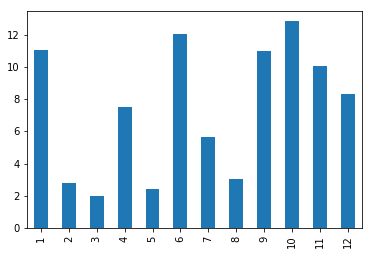

In [28]:
%matplotlib inline
gem['km'].plot(kind='bar')
plt.show()

Nu we van elke speler de afgelegde afstand weten, gaan we proberen om van elke speler de positie te identificeren.

Zoals we zagen begon GPS tracking van elke speler niet op het moment dat de wedstrijd begon. Daarom zullen we van de eerste beschikbare minuut bekijken waar elke speler heeft gelopen. We doen dit op basis van Stadion Galgenwaard, de thuisbasis van FC Utrecht.

In [29]:
start = alleSpelers.loc[(alleSpelers['GPStijd'] <= 143927.3)]
start.groupby('speler').head(2)

start1 = groep1.loc[(groep1['GPStijd'] <= 143927.3)]
start2 = groep2.loc[(groep2['GPStijd'] <= 143927.3)]

start1.groupby('speler').head(2)
start2.groupby('speler').head(2)

,GPStijd,lat,long,speler
0,143927.3,52.077944,5.145227,s7
56880,135402.1,52.078565,5.145675,s8
56881,135402.3,52.078568,5.145684,s8
137647,135451.3,52.078556,5.145593,s9
137648,135451.5,52.078553,5.145591,s9
211673,135602.1,52.078335,5.145257,s10
211674,135602.4,52.078339,5.145267,s10
291036,135526.1,52.078370,5.145448,s11
291037,135526.3,52.078402,5.145459,s11
369798,140521.6,52.077140,5.146069,s12


Het moment dat alle spelers op het veld staan is 143927.3. Speler 2 zit op dat moment wissel.

In [30]:
from bokeh.io import output_notebook, show
from bokeh.layouts import row, gridplot, widgetbox
from bokeh.charts import Histogram, BoxPlot, Scatter, Line, Bar
from bokeh.plotting import figure, ColumnDataSource
from bokeh.models import CustomJS, Slider

output_notebook()

Loading BokehJS ...

In [31]:
scatter = Scatter(start1, x='long', y='lat',  color='speler', title="Startpositie", xlabel="Lat", ylabel="Long")
show(scatter)


In [32]:
scatter = Scatter(start2, x='long', y='lat',  color='speler', title="Startpositie", xlabel="Lat", ylabel="Long")
show(scatter)

Meer latidute betekent dat de speler verder aan de rechterkant van het veld staat. meer longitude betekent dat de speler verder op het veld staat.

In [33]:
#spelers = spelers.drop(alleSpelers.columns[[0,1,2,]], axis=1)
spelers = alleSpelers
spelers = spelers.groupby(spelers['speler']).head(1)
spelers = spelers.drop(alleSpelers.columns[[0,1,2,]], axis=1)
spelers = spelers.reset_index()
spelers.index = spelers.index+1
spelers = spelers.drop(spelers.columns[0], axis =1)
spelers['afstand'] = gem['km']
spelers

,speler,afstand
1,s1,11.020788
2,s2,2.796066
3,s3,1.971963
4,s4,7.507911
5,s5,2.445916
6,s6,12.024308
7,s7,5.675406
8,s8,3.052722
9,s9,11.001132
10,s10,12.842166
